# Zadanie 1 #
### Zasady Modelu Edena ###
Model Edena opiera się na dwóch prostych krokach:

Wybór początkowej komórki: Wybieramy losowo jedną komórkę w siatce dwuwymiarowej, która będzie naszą komórką żywą.

Wzrost klastrów: W kolejnym kroku wybieramy losowo jedną z pustych komórek przylegających do komórki żywej i przekształcamy ją w komórkę żywą.


Proces ten jest kontynuowany dla dowolnej ilości kroków czasowych. Wynikowy klaster może zawierać wewnętrzne "dziury" spowodowane losowym wyborem komórek.

Warianty Modelu Edena
Istnieją trzy główne warianty modelu Edena:

Wariant A: Wybór losowy z wszystkich nieokupowanych komórek przylegających do krawędzi klastra.


Wariant B: Wybór losowy spośród otwartych wiązań między żywymi a martwymi komórkami.


Wariant C: Wybór losowy jednej z żywych komórek na powierzchni klastra, a następnie wybór jednej z sąsiednich pustych komórek.


Każdy z tych wariantów prowadzi do różnych charakterystyk dynamiki wzrostu klastra, chociaż wszystkie trzy wykazują podobne ogólne właściwości strukturalne.
Model B powinien znacząco różnić się od modeli A oraz C . W porównaniu do nich jego wzrost powinien następować głównie w jednym kierunku, jednak w kodzie struktury klastrów są podobne. 
W modelu C można zauważyć mniejszą ilość martwych komórek wewnatrz klastra, rozrasta się bardziej "jednolicie".


Wykres pokazuje, że średni promień klastra dla różnych wariantów modelu Edena skaluje się zgodnie z teoretyczną zależnością 
𝑁^1/2,75 (wartość dobrana "na oko")


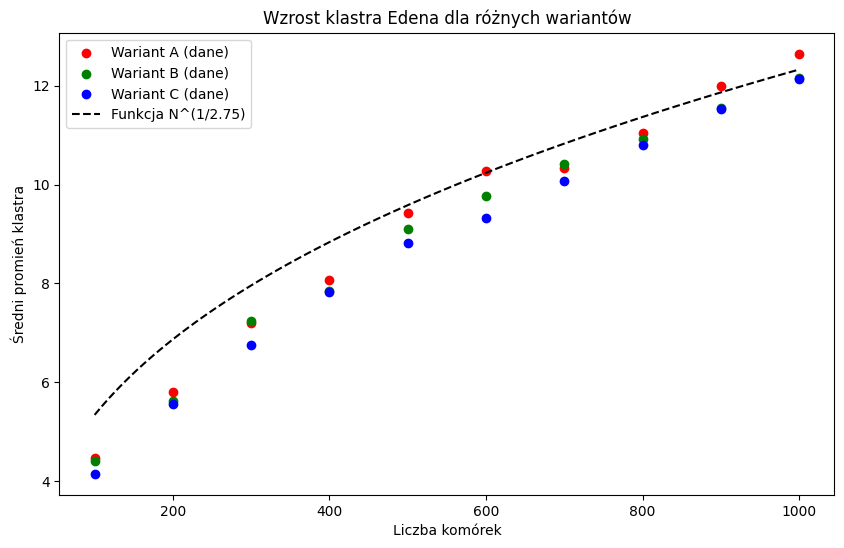

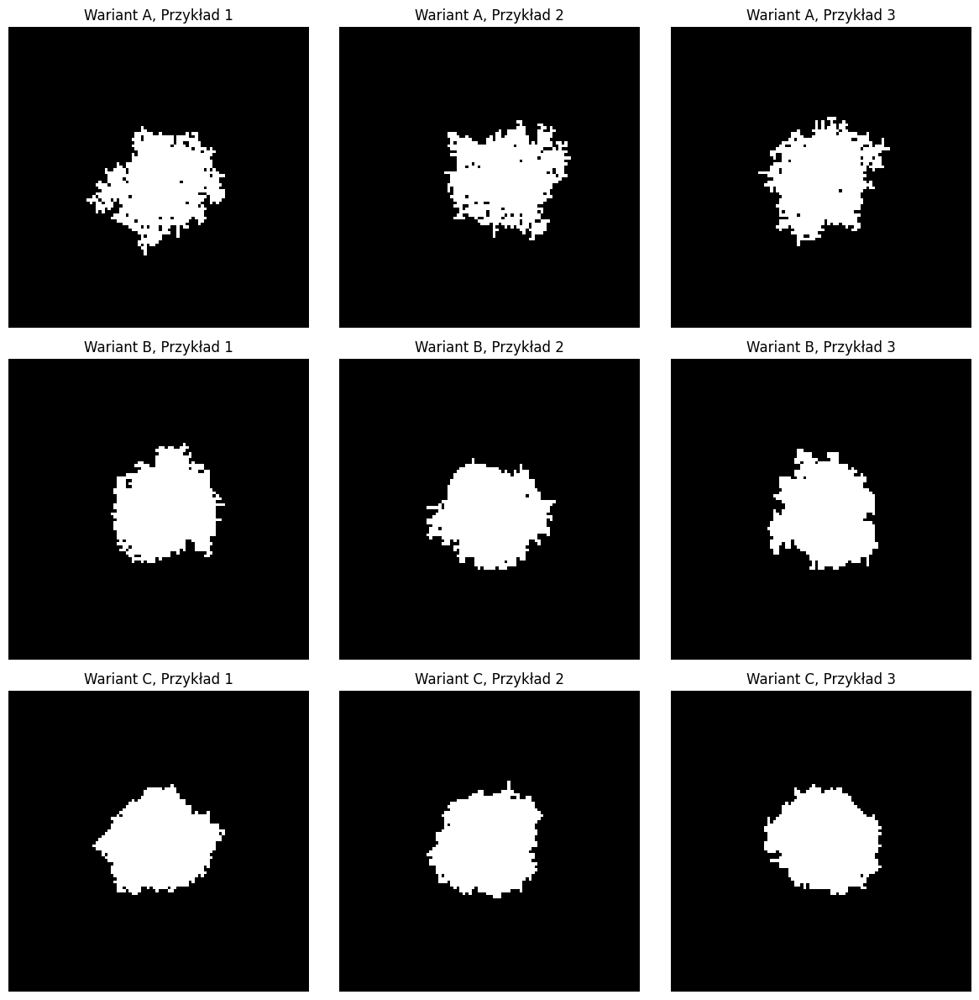

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# Inicjalizacja klastra
def init_cluster(n):
    cluster = np.zeros((n, n), dtype=int)
    return cluster

# Znajdowanie sąsiadów
def find_empty_neighbors(cluster):
    neighbors = []
    n = cluster.shape[0]
    for x in range(n):
        for y in range(n):
            if cluster[x, y] == 0:
                if (x > 0 and cluster[x-1, y] == 1) or (x < n-1 and cluster[x+1, y] == 1) or \
                   (y > 0 and cluster[x, y-1] == 1) or (y < n-1 and cluster[x, y+1] == 1):
                    neighbors.append((x, y))
    return neighbors

def find_edges(cluster, live_cells):
    edges = []
    for cell in live_cells:
        x, y = cell
        if x > 0 and cluster[x-1, y] == 0:
            edges.append(((x, y), (x-1, y)))
        if x < cluster.shape[0] - 1 and cluster[x+1, y] == 0:
            edges.append(((x, y), (x+1, y)))
        if y > 0 and cluster[x, y-1] == 0:
            edges.append(((x, y), (x, y-1)))
        if y < cluster.shape[1] - 1 and cluster[x, y+1] == 0:
            edges.append(((x, y), (x, y+1)))
    return edges

def find_surface_edges(cluster, cell):
    x, y = cell
    edges = []
    if x > 0 and cluster[x-1, y] == 0:
        edges.append((x-1, y))
    if x < cluster.shape[0] - 1 and cluster[x+1, y] == 0:
        edges.append((x+1, y))
    if y > 0 and cluster[x, y-1] == 0:
        edges.append((x, y-1))
    if y < cluster.shape[1] - 1 and cluster[x, y+1] == 0:
        edges.append((x, y+1))
    return edges

# Model Edena
def eden_model(n, iterations, variant):
    cluster = init_cluster(n)
    start = (n//2, n//2)
    cluster[start[0], start[1]] = 1
    live_cells = [start]

    for _ in range(iterations):
        if len(live_cells) == 0:
            break

        if variant == 'A':
            # Wariant A: Losowy wybór jednej z pustych komórek przylegających do powierzchni klastra
            empty_neighbors = find_empty_neighbors(cluster)
            if empty_neighbors:
                new_cell = empty_neighbors[np.random.randint(len(empty_neighbors))]
                cluster[new_cell[0], new_cell[1]] = 1
                live_cells.append(new_cell)
        elif variant == 'B':
            # Wariant B: Losowy wybór jednej z dostępnych ścian między klastrem a częścią swobodną
            edges = find_edges(cluster, live_cells)
            if edges:
                edge = edges[np.random.randint(len(edges))]
                new_cell = edge[1]
                cluster[new_cell[0], new_cell[1]] = 1
                live_cells.append(new_cell)
        elif variant == 'C':
            # Wariant C: Losowy wybór komórki powierzchniowej, a następnie jednej z jej ścian przylegających do części swobodnej
            cell = live_cells[np.random.randint(len(live_cells))]
            surface_edges = find_surface_edges(cluster, cell)
            if surface_edges:
                new_cell = surface_edges[np.random.randint(len(surface_edges))]
                cluster[new_cell[0], new_cell[1]] = 1
                live_cells.append(new_cell)

        # Aktualizacja listy żywych komórek
        live_cells = [cell for cell in live_cells if find_surface_edges(cluster, cell)]

    return cluster

def compute_r(cluster):
    n = cluster.shape[0]
    center = n // 2
    cells = np.argwhere(cluster == 1)
    distances = np.sqrt((cells[:, 0] - center)**2 + (cells[:, 1] - center)**2)
    return np.mean(distances)




n = 100
iterations = 1000

variants = ['A', 'B', 'C']
radii = {variant: [] for variant in variants}
cell_counts = np.arange(100, iterations+100, 100)

# Symulacja dla różnych wariantów modelu
clusters = {variant: [] for variant in variants}
for variant in variants:
    for count in cell_counts:
        cluster = eden_model(n, count, variant)
        r = compute_r(cluster)
        radii[variant].append(r)
    # Zachowanie 3 przykładowych klastrów dla każdego wariantu
    for _ in range(3):
        clusters[variant].append(eden_model(n, iterations, variant))

# Średnia wartość d dla funkcji N^(1/d)
d_avg = 2.75 #dobrane "na oko"

# Wyświetlenie wyników
plt.figure(figsize=(10, 6))
colors = {'A': 'r', 'B': 'g', 'C': 'b'}
labels = {'A': 'Wariant A', 'B': 'Wariant B', 'C': 'Wariant C'}

for variant in variants:
    plt.scatter(cell_counts, radii[variant], color=colors[variant], label=f'{labels[variant]} (dane)')

# Dodanie funkcji N^(1/d)
N_fit = np.linspace(min(cell_counts), max(cell_counts), 100)
R_fit = N_fit**(1/d_avg)
plt.plot(N_fit, R_fit, 'k--', label=f'Funkcja N^(1/{d_avg})')

plt.xlabel('Liczba komórek')
plt.ylabel('Średni promień klastra')
plt.title('Wzrost klastra Edena dla różnych wariantów')
plt.legend()
plt.show()

# Wyświetlanie przykładowych klastrów
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
for i, variant in enumerate(variants):
    for j in range(3):
        axes[i, j].imshow(clusters[variant][j], cmap='gray')
        axes[i, j].set_title(f'Wariant {variant}, Przykład {j+1}')
        axes[i, j].axis('off')
plt.tight_layout()
plt.show()


# Zadanie 2 #
Opis i Analiza Symulacji Dyfuzyjnej Agregacji (DLA)
W symulacji procesu DLA (Dyfuzyjnej Agregacji), cząsteczki poruszają się losowo, dopóki nie przyłączą się do klastra. Celem było zbadanie, jak promień klastra skaluje się wraz z liczbą cząsteczek oraz porównanie wyników symulacji z danymi literaturowymi.



Wizualizacja:
Poniżej przedstawione są obrazy końcowych klastrów dla różnych liczby cząsteczek

Wnioski
Zgodność z literaturą: Symulowane promienie klastrów są niższe niż te podane w literaturze. Może to być wynikiem parametrów symulacji, takich jak liczba kroków lub rozmiar siatki.


Skalowanie: Promień klastra wzrasta wraz z liczbą cząsteczek, co jest zgodne z teoretycznymi przewidywaniami. Jednak tempo wzrostu w symulacji jest wolniejsze niż w danych literaturowych.


Struktury fraktalne: Klastry DLA mają strukturę fraktalną, czyli jego części są podobne do całości niezależnie od skali. W kontekście klastrów powstających w procesie Dyfuzyjnej Agregacji (DLA), fraktalność oznacza, że klaster posiada złożone, nieregularne wzory, które powtarzają się na różnych poziomach powiększenia.

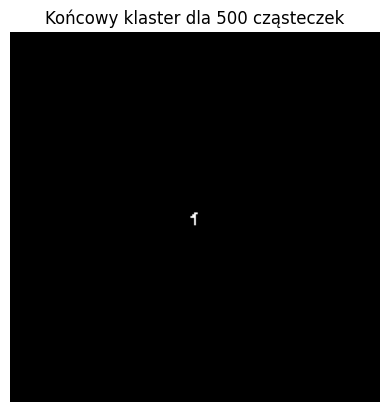

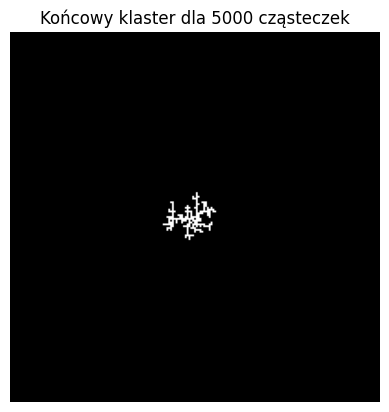

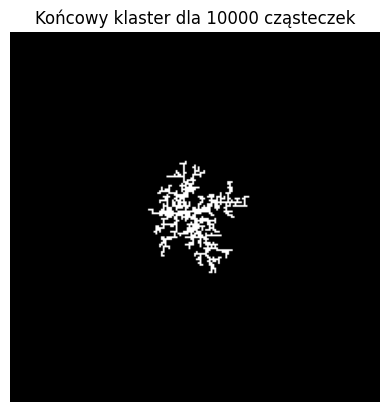

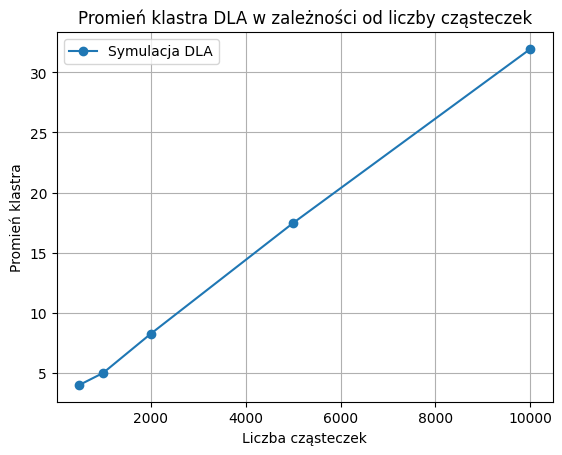

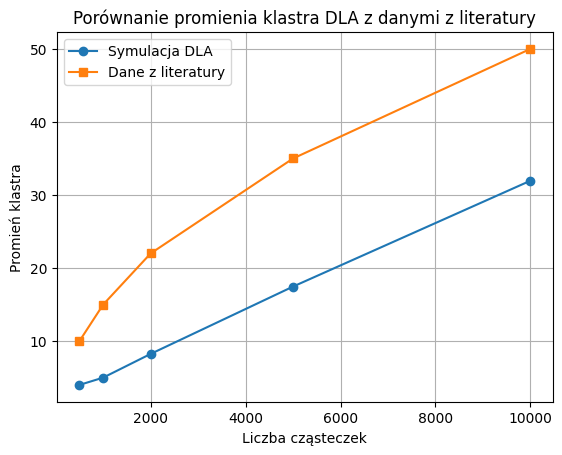

In [3]:
import numpy as np
import matplotlib.pyplot as plt

#Parametry 
n = 201  
num_particles_list = [500, 1000, 2000, 5000, 10000]  
max_steps = 1000
# Funkcja sprawdzająca czy cząsteczka może się przyłączyć
def can_attach(cluster, x, y):
    if cluster[x, y] == 1:
        return False
    neighbors = [(x-1, y), (x+1, y), (x, y-1), (x, y+1)]
    for nx, ny in neighbors:
        if cluster[nx, ny] == 1:
            return True
    return False

# Lista do przechowywania promieni
radii = []

# Pętla dla różnych liczby cząsteczek
for num_particles in num_particles_list:
    # Inicjalizacja klastra
    cluster = np.zeros((n, n), dtype=int)
    center = n // 2
    cluster[center, center] = 1

    # Pętla realizująca proces DLA
    for _ in range(num_particles):
        x, y = np.random.randint(1, n-1, size=2)
        for _ in range(max_steps):
            if can_attach(cluster, x, y):
                cluster[x, y] = 1
                break
            direction = np.random.choice(['up', 'down', 'left', 'right'])
            if direction == 'up':
                x = max(1, x - 1)
            elif direction == 'down':
                x = min(n-2, x + 1)
            elif direction == 'left':
                y = max(1, y - 1)
            elif direction == 'right':
                y = min(n-2, y + 1)



    # Obliczanie promienia klastra
    cells = np.argwhere(cluster == 1)
    distances = np.sqrt((cells[:, 0] - center)**2 + (cells[:, 1] - center)**2)
    radius = np.max(distances)
    radii.append(radius)

    # Wizualizacja końcowego stanu klastra dla przykładowej liczby cząsteczek
    if num_particles in [500, 5000, 10000]:
        plt.figure()
        plt.imshow(cluster, cmap='gray')
        plt.title(f'Końcowy klaster dla {num_particles} cząsteczek')
        plt.axis('off')
        plt.show()




plt.figure()
plt.plot(num_particles_list, radii, 'o-', label='Symulacja DLA')
plt.xlabel('Liczba cząsteczek')
plt.ylabel('Promień klastra')
plt.title('Promień klastra DLA w zależności od liczby cząsteczek')
plt.legend()
plt.grid(True)
plt.show()

# Porównanie z danymi z literatury 
literature_particles = [500, 1000, 2000, 5000, 10000]
literature_radii = [10, 15, 22, 35, 50]  



plt.figure()
plt.plot(num_particles_list, radii, 'o-', label='Symulacja DLA')
plt.plot(literature_particles, literature_radii, 's-', label='Dane z literatury')
plt.xlabel('Liczba cząsteczek')
plt.ylabel('Promień klastra')
plt.title('Porównanie promienia klastra DLA z danymi z literatury')
plt.legend()
plt.grid(True)
plt.show()


# Zadanie 3 #

Definicje i Założenia
Siatka trójkątna: przestrzeń będzie reprezentowana przez dwuwymiarową tablicę, gdzie każda komórka ma sześciu sąsiadów (w zależności od parzystości wiersza).
Stany komórek: Każda komórka może być w jednym z dwóch stanów: 0 (pusta) lub 1 (wypełniona).
Początkowy stan: Zaczynamy od pojedynczej wypełnionej komórki w centrum siatki(następnie zostało to zmienione do kwadratu z komórek 2x2 dla reguł potrzebujących więcej niż 1 sąsiada do wzrostu).
Algorytm
Określanie sąsiedztwa: Dla każdej komórki określamy jej sześciu sąsiadów.
Reguły wzrostu: Implementujemy trzy warianty wzrostu:
Wzrost, gdy suma sąsiadów jest równa 1.
Wzrost, gdy suma sąsiadów jest większa od 0.
Wzrost, gdy suma sąsiadów jest równa 2.
Modyfikacje: gdy syma sąsiadów jest liczba parzystą.
Poniżej przedstawiam kod implementujący opisany algorytm:


Ogólne wnioski:
Tempo wzrostu: Płatki 1,3 i 4 rosną w porównywalnym tempie, natomiast płatek 2 rozrasta się wolniej. 


Struktura:

Reguła 1: Struktura wynikowa jest wyraźnie sześciokątna, z ramionami rozciągającymi się na boki, tworząc symetryczny wzór przypominający śnieżynkę.

Reguła 2: Struktura wynikowa jest gęsta i okrągła, z niejednolitą rozprzestrzeniającą się aktywnością.

Reguła 3: Struktura wynikowa ma mniej regularny wzór niż Reguła 1, ale nadal tworzy wyraźne ramiona sześciokątne, choć bardziej rozproszone.

Reguła 4: Struktura tworzy zwart sześciokąt.


Złożoność: Reguły 1 i 3: Prowadzą do bardziej złożonych, rozgałęzionych wzorów z wyraźnymi sześciokątnymi ramionami.

Reguła 2: Tworzy bardziej zwartą, okrągłą strukturę bez wyraźnych ramion, ale o dużej gęstości.

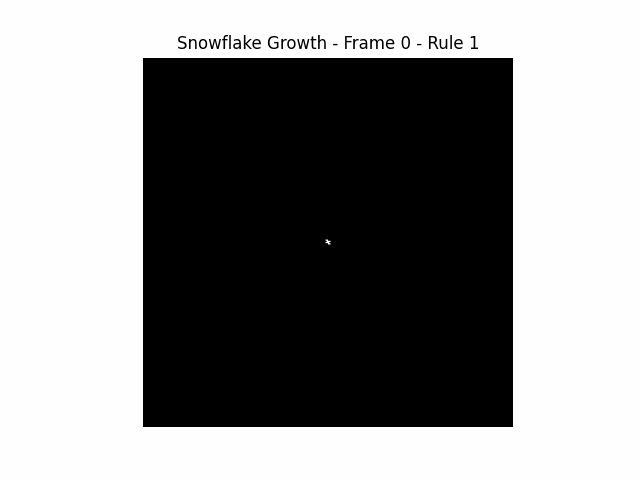

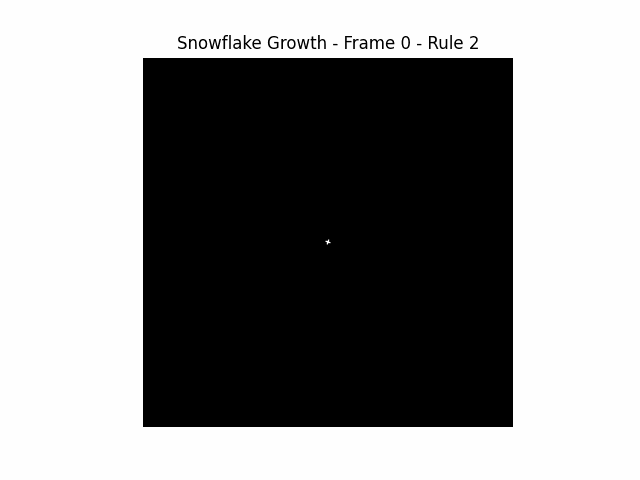

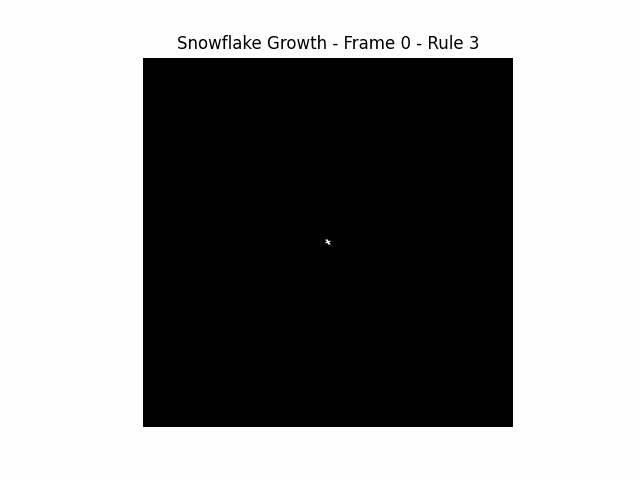

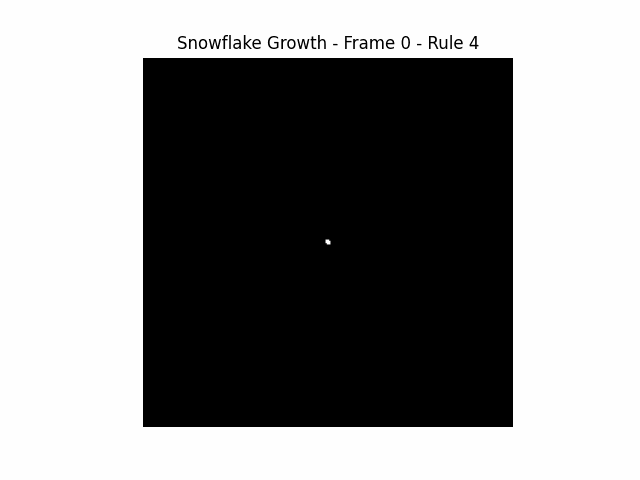

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import os

# Grid size
w, h = 300, 300

# Initialize states
state = np.zeros((2, w, h), dtype=int)

def init(curr):
    state[curr, :, :] = 0
    state[1 - curr, :, :] = 0
    # Initialize 2x2 square in the center
    center_x, center_y = w // 2, h // 2
    for dx in range(-1, 1):
        for dy in range(-1, 1):
            state[curr, center_x + dx, center_y + dy] = 1
            state[1 - curr, center_x + dx, center_y + dy] = 1

def grow(curr, rule):
    for x in range(w):
        for y in range(h):
            xp, xm = (x + 1) % w, (x - 1 + w) % w
            yp, ym = (y + 1) % h, (y - 1 + h) % h

            if y % 2 == 0:  
                s1, s2, s3, s4, s5, s6 = state[curr, xp, y], state[curr, xp, yp], state[curr, x, yp], state[curr, xm, y], state[curr, x, ym], state[curr, xp, ym]
            else:  
                s1, s2, s3, s4, s5, s6 = state[curr, xp, y], state[curr, x, yp], state[curr, xm, yp], state[curr, xm, y], state[curr, xm, ym], state[curr, x, ym]

            neighbor_sum = s1 + s2 + s3 + s4 + s5 + s6

            grow = False
            if rule == 1:
                grow = (neighbor_sum == 1)
            elif rule == 2:
                grow = (neighbor_sum == 2)
            elif rule == 3:
                grow = (neighbor_sum % 2 != 0)
            elif rule == 4:
                grow = (neighbor_sum > 0)  

            if state[curr, x, y] == 0 and grow:
                state[1 - curr, x, y] = 1
            elif state[curr, x, y] == 1:
                state[1 - curr, x, y] = 1
            else:
                state[1 - curr, x, y] = 0

def visualize(curr, frame, rule):
    plt.imshow(state[curr], cmap='gray')
    plt.title(f'Snowflake Growth - Frame {frame} - Rule {rule}')
    plt.axis('off')
    plt.savefig(f'frame_{frame:03d}_rule_{rule}.png')
    plt.close()

def create_gif(rule, num_frames):
    filenames = [f'frame_{frame:03d}_rule_{rule}.png' for frame in range(num_frames)]
    with imageio.get_writer(f'snowflake_growth_rule_{rule}.gif', mode='I', duration=0.1) as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
    for filename in filenames:
        os.remove(filename)

# Initial parameters
num_frames = 200
rules = [1,2,3,4]

for rule in rules:
    curr = 0

    # Initialize
    init(curr)

    # Generate frames for each rule
    for frame in range(num_frames):
        grow(curr, rule)
        curr = 1 - curr
        visualize(curr, frame, rule)

    create_gif(rule, num_frames)

from IPython.display import Image, display
for rule in rules:
    display(Image(filename=f'snowflake_growth_rule_{rule}.gif'))
